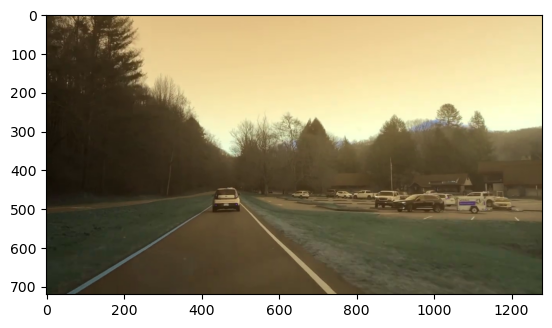

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def make_points(image, line):
    # Calculate endpoints of a line within the image
    slope, intercept = line
    y1 = int(image.shape[0])  # Bottom of the image
    y2 = int(y1 * 7 / 10)      # Slightly lower than the middle
    x1 = int((y1 - intercept) / slope)
    x2 = int((y2 - intercept) / slope)
    return [(x1, y1, x2, y2)]

def average_slope_intercept(image, lines):
    # Separate lines into left and right lanes based on slope
    left_fit = []
    right_fit = []
    if lines is None or len(lines) == 0:
        return None
    for line in lines:
        for x1, y1, x2, y2 in line:
            # Fit a line to points and calculate slope & intercept
            fit = np.polyfit((x1, x2), (y1, y2), 1)
            slope = fit[0]
            intercept = fit[1]
            if slope < 0:  # Left lane has negative slope
                left_fit.append((slope, intercept))
            else:  # Right lane has positive or zero slope
                right_fit.append((slope, intercept))
    if not left_fit or not right_fit:
        return None
    # Average the slopes and intercepts for left and right lanes
    left_fit_average = np.average(left_fit, axis=0)
    right_fit_average = np.average(right_fit, axis=0)
    left_line = make_points(image, tuple(left_fit_average))
    right_line = make_points(image, tuple(right_fit_average))
    averaged_lines = [left_line, right_line]
    return averaged_lines

def canny(img):
    # Convert image to grayscale, apply Gaussian blur, and detect edges
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    kernel = 5
    blur = cv2.GaussianBlur(gray, (kernel, kernel), 0)
    canny = cv2.Canny(blur, 50, 150)
    return canny

def display_lines(img, lines):
    # Draw detected lines on a black canvas
    line_image = np.zeros_like(img)
    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:
                cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 10)
    return line_image

def region_of_interest(canny):
    # Create a mask to focus on the region where lane lines are expected
    height = canny.shape[0]
    width = canny.shape[1]
    mask = np.zeros_like(canny)
    triangle = np.array([[
        (0, height),
        (550, 400),
        (800, height),
    ]], np.int32)
    cv2.fillPoly(mask, triangle, 255)
    masked_image = cv2.bitwise_and(canny, mask)
    return masked_image

image = cv2.imread(r'C:\Users\admin\Desktop\test6.png')
plt.imshow(image)



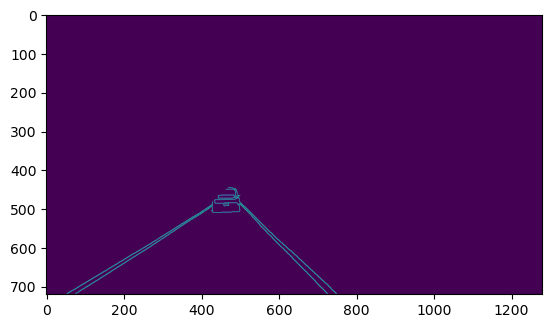

In [2]:
# Lane Detection Process

# Read the image file
image = cv2.imread(r'C:\Users\admin\Desktop\test6.png')

# Process the image
lane_image = np.copy(image)
canny_image = canny(lane_image)
cropped_image = region_of_interest(canny_image)

plt.imshow(cropped_image)

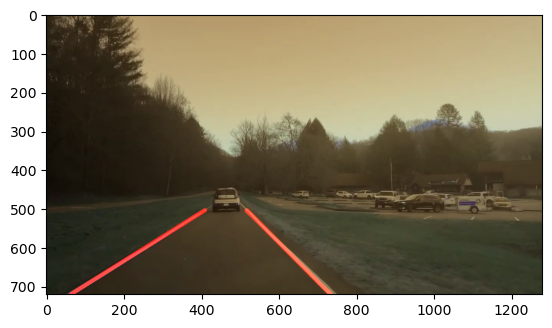

In [3]:
# Detect lines in the image
lines = cv2.HoughLinesP(cropped_image, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
averaged_lines = average_slope_intercept(lane_image, lines)

# Display detected lanes on the original image
line_image = display_lines(lane_image, averaged_lines)
combo_image = cv2.addWeighted(lane_image, 0.8, line_image, 1, 1)

# Show the final image
plt.imshow(combo_image)
plt.show()


In [ ]:

# lane_image = np.copy(image)
# lane_canny = canny(lane_image)
# cropped_canny = region_of_interest(lane_canny)
# lines = cv2.HoughLinesP(cropped_canny, 2, np.pi/180, 100, np.array([]), minLineLength=40,maxLineGap=5)
# averaged_lines = average_slope_intercept(image, lines)
# line_image = display_lines(lane_image, averaged_lines)
# combo_image = cv2.addWeighted(lane_image, 0.8, line_image, 1, 0)
 
#
cap = cv2.VideoCapture(r"C:\Users\admin\Desktop\test6.mp4")
while(cap.isOpened()):
    _, frame = cap.read()
    if frame is None:
        print("Error: Could not read frame from the video.")
        continue
    # Handle the error, e.g., exit the program or return an error code

    canny_image = canny(frame)
    cropped_canny = region_of_interest(canny_image)
    lines = cv2.HoughLinesP(cropped_canny, 2, np.pi/180, 100, np.array([]), minLineLength=20,maxLineGap=5)
    averaged_lines = average_slope_intercept(frame, lines)
    line_image = display_lines(frame, averaged_lines)
    combo_image = cv2.addWeighted(frame, 0.8, line_image, 1, 1)
    cv2.imshow("result", combo_image)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from the video.
Error: Could not read frame from

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

